## Lab 4: Quasi-Geostrophic Omega Equation
In this week's lab, we will use archived (Part I) and real-time (Part II) GFS model data to create 925 hPa, 700 hPa, and 500 hPa synoptic analyses, from which we will use the quasi-geostrohpic omega equation to investigate areas of ascent and descent. 
<br />

<br />

### Useful Documentation
1. Xarray open_dataset:  https://docs.xarray.dev/en/stable/generated/xarray.open_dataset.html
2. Matplotlib contour: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html
3. Cartopy feature: https://scitools.org.uk/cartopy/docs/latest/matplotlib/feature_interface.html
4. Datetime: https://docs.python.org/3/library/datetime.html



<br />

### Part I Instructions
So that you can complete Part I of this lab, I have locally archived the 11 Feburary 2015 1200 UTC GFS analysis.  The location of this data is provided for you below, as is the filenaming convention if you wish to use a datetime object to select your time of interest.

Create the following maps using the GFS analysis data:

<ul>
  <li>500 hPa absolute vorticity, and geopotential height
  <li>925 hPa absolute vorticity, and geopotential height
  <li>700 hPa air temperature, wind barbs, and geopotential height
</ul>

Be sure your maps follow the "good map" guidelines, and do not forget to import the necessary packages before you start coding.  Note that the second code block below provides you with six different points to plot on your maps; make sure you add these lines to your plotting function after you define the subplot for each map you create.

In [1]:
from datetime import datetime
from metpy.io import add_station_lat_lon
from metpy.plots import StationPlot, sky_cover
import numpy as np
import cartopy.crs as crs 
import cartopy
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import xarray as xr
from siphon.simplewebservice.iastate import IAStateUpperAir
import sys
from metpy.units import units
import metpy.calc as calc
import pandas as pd

In [2]:
'''
# variable to specify datetime
time = 

# location of the data
data_location = "/data/AtmSci360/Synp2/Lab_4/"

# naming convention for the GFS data files (if you want to use datetime)
file_name = f"gfs.0p25.{time:%Y%m%d%H}.f000.grib2"
'''

'\n# variable to specify datetime\ntime = \n\n# location of the data\ndata_location = "/data/AtmSci360/Synp2/Lab_4/"\n\n# naming convention for the GFS data files (if you want to use datetime)\nfile_name = f"gfs.0p25.{time:%Y%m%d%H}.f000.grib2"\n'

In [3]:
'''
ax.text(-50,49.5, "A", size = 16, weight="bold", transform=crs.PlateCarree())
ax.text(-121,48, "B", size = 16, weight="bold", transform=crs.PlateCarree())
ax.text(-92,47, "C", size = 16, weight="bold", transform=crs.PlateCarree())
ax.text(-84.5,42.5, "D", size = 16, weight="bold", transform=crs.PlateCarree())
ax.text(-104.5,35.75, "E", size = 16, weight="bold", transform=crs.PlateCarree())
ax.text(-87,30.25, "F", size = 16, weight="bold", transform=crs.PlateCarree())
'''

'\nax.text(-50,49.5, "A", size = 16, weight="bold", transform=crs.PlateCarree())\nax.text(-121,48, "B", size = 16, weight="bold", transform=crs.PlateCarree())\nax.text(-92,47, "C", size = 16, weight="bold", transform=crs.PlateCarree())\nax.text(-84.5,42.5, "D", size = 16, weight="bold", transform=crs.PlateCarree())\nax.text(-104.5,35.75, "E", size = 16, weight="bold", transform=crs.PlateCarree())\nax.text(-87,30.25, "F", size = 16, weight="bold", transform=crs.PlateCarree())\n'

In [4]:
def process_upper_air_data(time):
    data_location = "/data/AtmSci360/Synp2/Lab_4/"

    file_name = f"gfs.0p25.{time:%Y%m%d%H}.f000.grib2"
  
    model_data = xr.open_dataset(f"{data_location}gfs.0p25.{time:%Y%m%d%H}.f000.grib2", engine='cfgrib', filter_by_keys={'typeOfLevel': 'isobaricInhPa'})
    

    model_data['t'] = model_data["t"].metpy.convert_units('degC')
    model_data['u'] = model_data["u"].metpy.convert_units('kt')
    model_data['v'] = model_data["v"].metpy.convert_units('kt')
    
    
    
    
    return model_data

In [5]:
def plot_vort_gh(time, model_data):
    model_data=model_data.sel(isobaricInhPa=500)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
    ax.text(-50,49.5, "A", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-121,48, "B", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-92,47, "C", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-84.5,42.5, "D", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-104.5,35.75, "E", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-87,30.25, "F", size = 16, weight="bold", transform=crs.PlateCarree())
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 500 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

In [6]:
def plot_700_map(time,model_data):
    model_data=model_data.sel(isobaricInhPa=700)
   
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
    fig = plt.figure(figsize=(11,85),dpi=300)
    
    ax = plt.subplot(projection = proj)
    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)

    
    ax.set_extent((-125, -50, 23, 60))



    filtered_gh = gaussian_filter(model_data["gh"].values,2)

    cont = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_gh, np.arange(0,12000,30), linewidths = 0.7, colors='k', transform=crs.PlateCarree())
    
 
    ax.clabel(cont, cont.levels, inline=True, fmt=lambda v: format(v, '.0f')[:3], fontsize=6)
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-30,38,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)


    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    

    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4)
    
    ax.text(-50,49.5, "A", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-121,48, "B", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-92,47, "C", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-84.5,42.5, "D", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-104.5,35.75, "E", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-87,30.25, "F", size = 16, weight="bold", transform=crs.PlateCarree())
 
    plt.title("700 hPa Temperature (red | $\degree$C), Wind (barbs | kts), and Geopotential Heights (black | dm)", size=9, weight="bold", loc="left")
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")
   
    plt.show()

In [7]:
def plot_925_map(time, model_data):
    model_data=model_data.sel(isobaricInhPa=925)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,30),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
        
    ax.text(-50,49.5, "A", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-121,48, "B", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-92,47, "C", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-84.5,42.5, "D", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-104.5,35.75, "E", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-87,30.25, "F", size = 16, weight="bold", transform=crs.PlateCarree())
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 925 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

skipping variable: paramId==260131 shortName='o3mr'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   30.,   20.,   10.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([400., 350., 300., 250., 200., 150., 100.,  70.,  50.,  30.,  20.,
        10.]))
skipping variable: paramId==135 shortName='w'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3

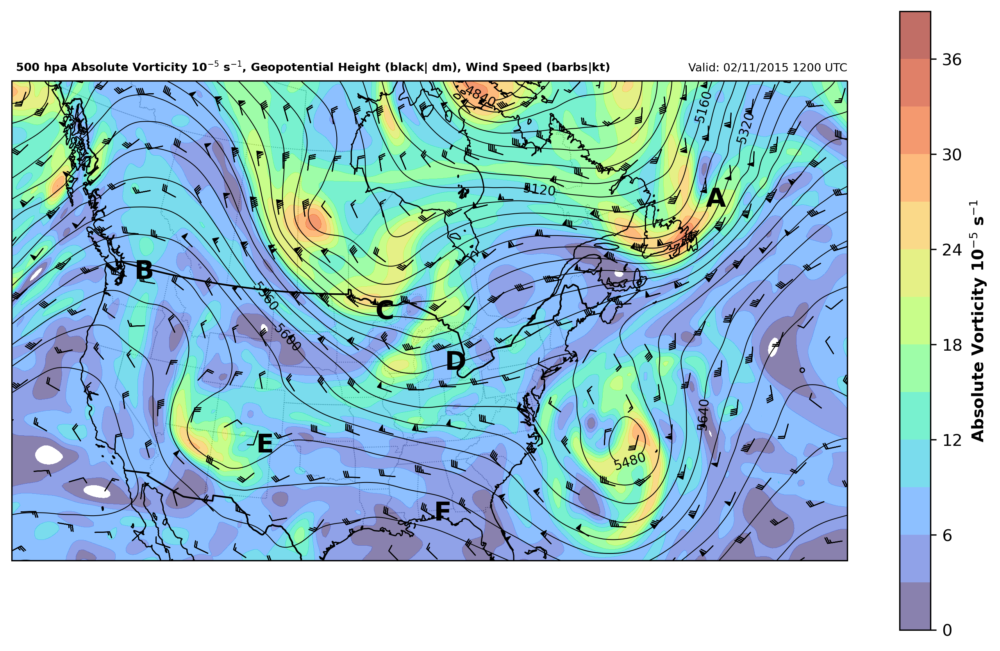

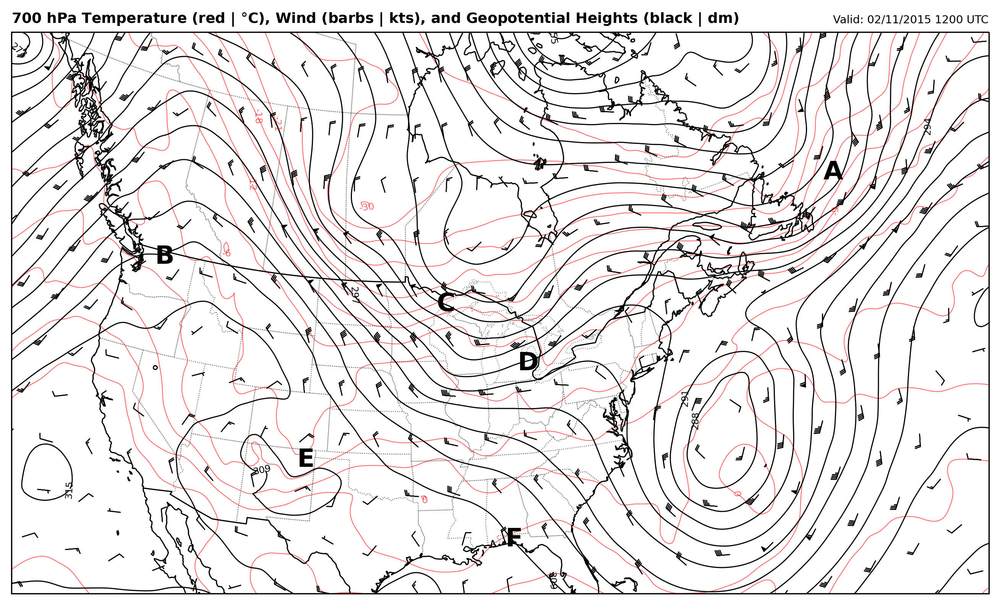

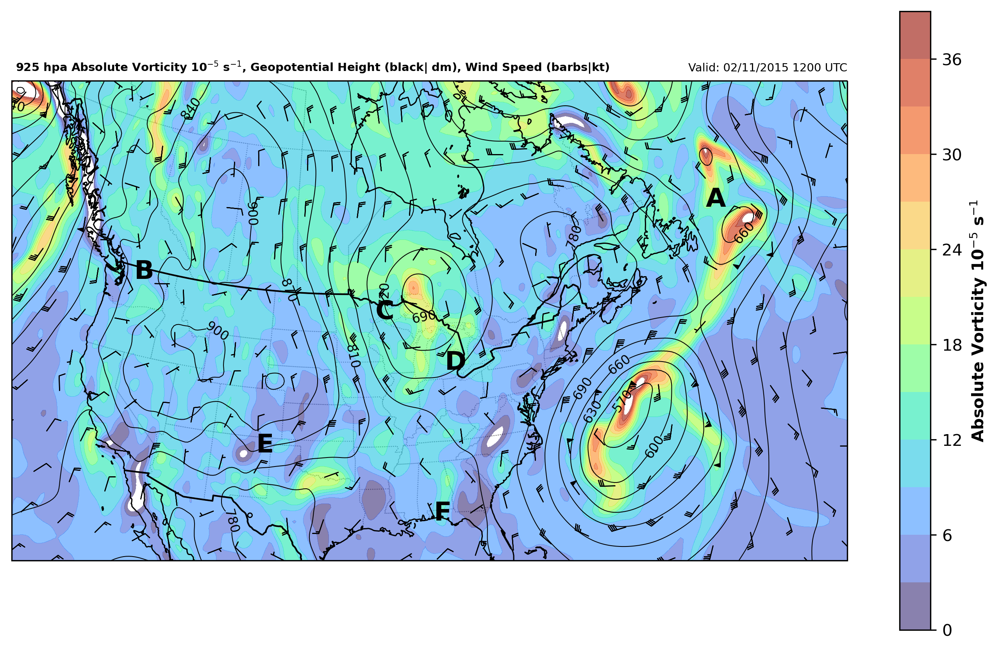

In [8]:
time=datetime(2015,2,11,12)
model_data=process_upper_air_data(time)
plot_vort_gh(time, model_data)
plot_700_map(time,model_data)
plot_925_map(time,model_data)

<br />

### Part II Instructions
So that you can complete Part II of this lab, I have locally archived GFS analyses starting at 1200 UTC 8 March 2023.  As in Part I, the location of these analyses is provided for you below, as is the filenaming convention if you wish to use a datetime object to select your time of interest.

Create the following maps using the GFS analysis time of your choosing:

<ul>
  <li>500 hPa absolute vorticity, and geopotential height
  <li>925 hPa absolute vorticity, and geopotential height
  <li>700 hPa air temperature, wind barbs, and geopotential height
</ul>


Be sure your maps follow the "good map" guidelines, and do not forget to import the necessary packages before you start coding. 

In [9]:
'''
# variable to specify datetime
time = 

# location of the data
data_location = "/data/AtmSci360/Synp2/Lab_4/"

# naming convention for the GFS data files (if you want to use datetime)
file_name = f"{time:%m%d%y_%H}_gfs.grib2"
'''

'\n# variable to specify datetime\ntime = \n\n# location of the data\ndata_location = "/data/AtmSci360/Synp2/Lab_4/"\n\n# naming convention for the GFS data files (if you want to use datetime)\nfile_name = f"{time:%m%d%y_%H}_gfs.grib2"\n'

In [10]:
def process_upper_air_data2(time):
    data_location = "/data/AtmSci360/Synp2/Lab_4/"
    file_name = f"{time:%m%d%y_%H}_gfs.grib2"
  
    model_data = xr.open_dataset(f"{data_location}{time:%m%d%y_%H}_gfs.grib2", engine='cfgrib', filter_by_keys={'typeOfLevel': 'isobaricInhPa'})

    
   
    model_data['t'] = model_data["t"].metpy.convert_units('degC')
    model_data['u'] = model_data["u"].metpy.convert_units('kt')
    model_data['v'] = model_data["v"].metpy.convert_units('kt')
    
    
    return model_data

In [11]:
def plot_real_500(time, model_data):
    model_data=model_data.sel(isobaricInhPa=500)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 500 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

In [12]:
def plot_real_700(time,model_data):
    model_data=model_data.sel(isobaricInhPa=700)
   
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
    fig = plt.figure(figsize=(11,85),dpi=300)
    
    ax = plt.subplot(projection = proj)
    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)

    
    ax.set_extent((-125, -50, 23, 60))



    filtered_gh = gaussian_filter(model_data["gh"].values,2)

    cont = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_gh, np.arange(0,12000,40), linewidths = 0.7, colors='k', transform=crs.PlateCarree())
    
 
    ax.clabel(cont, cont.levels, inline=True, fmt=lambda v: format(v, '.0f')[:3], fontsize=6)
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-20,38,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)


    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    

    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4)
    
 
    plt.title("700 hPa Temperature (red | $\degree$C), Wind (barbs | kts), and Geopotential Heights (black | dm)", size=9, weight="bold", loc="left")
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")
   
    plt.show()

In [13]:
def plot_real_925(time, model_data):
    model_data=model_data.sel(isobaricInhPa=925)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
        
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 925 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

Can't create file '/data/AtmSci360/Synp2/Lab_4/031123_06_gfs.grib2.923a8.idx'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/messages.py", line 534, in from_indexpath_or_filestream
    with compat_create_exclusive(indexpath) as new_index_file:
  File "/opt/tljh/user/lib/python3.7/contextlib.py", line 112, in __enter__
    return next(self.gen)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/messages.py", line 500, in compat_create_exclusive
    fd = os.open(path, os.O_WRONLY | os.O_CREAT | os.O_EXCL)
PermissionError: [Errno 13] Permission denied: '/data/AtmSci360/Synp2/Lab_4/031123_06_gfs.grib2.923a8.idx'
Can't read index file '/data/AtmSci360/Synp2/Lab_4/031123_06_gfs.grib2.923a8.idx'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/messages.py", line 544, in from_indexpath_or_filestream
    index_mtime = os.path.getmtime(indexpath)
  File "/opt/tljh/user/lib/python3.7/genericpath.py", 

/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:836: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:836: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:982: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings.extend(multi_line_string)
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:982: ShapelyDeprecatio

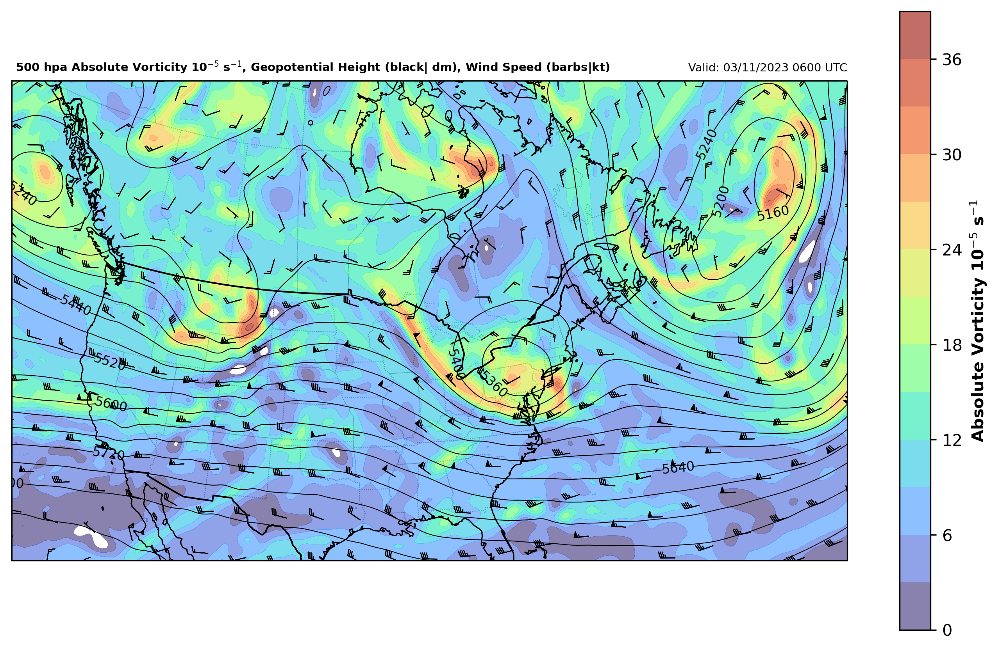

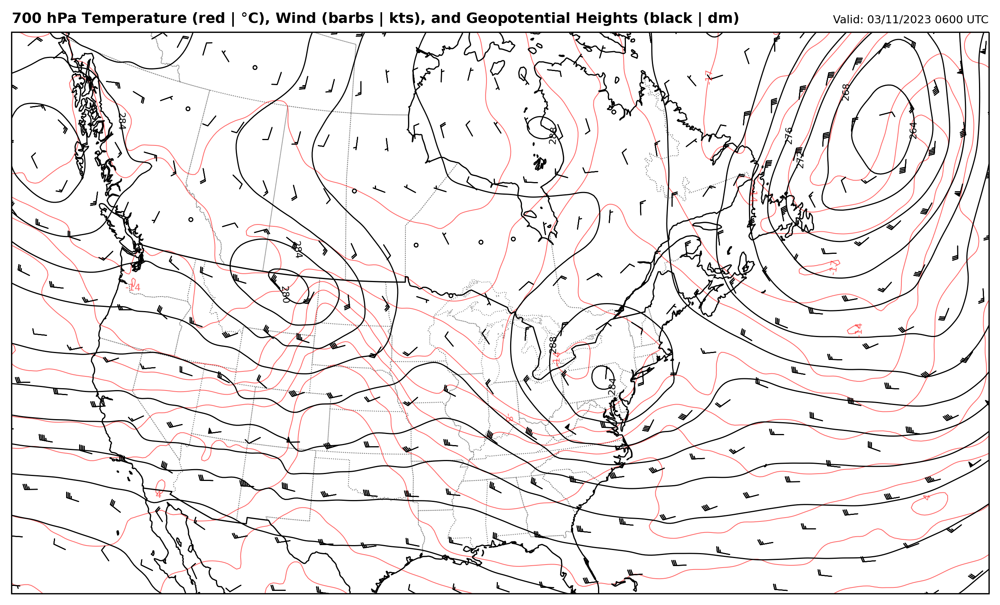

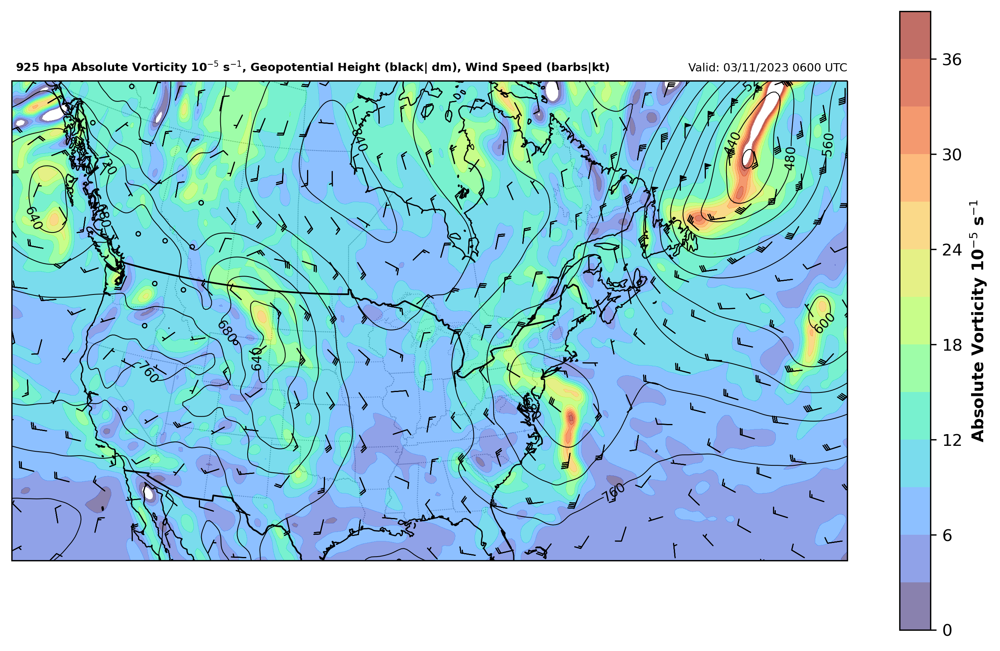

In [14]:
time=datetime(2023,3,11,6)
model_data=process_upper_air_data2(time)
plot_real_500(time, model_data)
plot_real_700(time,model_data)
plot_real_925(time,model_data)